# Guidelines

**Please read the guidelines before proceeding!**

# Read the data from spreadsheet:

In order to access a shared with you folder or file in Google Colab you have to:





1.   Go to **Shared with me** in Google Drive.
2.   Select the folder or file you want to acess.
3.   Right click on it and choose **Add shortcut to drive**.
4.   A pop-up window will apear, Select **MyDrive** then click on **Add Shortcut**.
5.   Now, Go to your Google Colab Notebook and mount to Google Drive with:

```
from google.colab import drive

drive.mount("/content/gdrive")
```




**Note**: If the solution above doesn't work , please add the spreadsheet in your google drive root location.




# Read the data from spreadsheet

In [ ]:
from google.colab import auth
auth.authenticate_user()

import gspread
from google.auth import default
import pandas as pd

# Authenticate and create a gspread client
creds, _ = default()
gc = gspread.authorize(creds)

# the code to mount the drive
from google.colab import drive

drive.mount("/content/drive/")

# Open the Google Sheet and get the data
worksheet = gc.open('PianoTiles_Data_Copy').sheet1

# Get all values from the worksheet
rows = worksheet.get_all_values()

# Create a DataFrame, specifying the first row as header
df = pd.DataFrame(rows[1:], columns=rows[0])

# Print the DataFrame to verify
df

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


,GlobalID,EntryID,Skeleton0_X,Skeleton0_Y,Skeleton0_Z,Skeleton1_X,Skeleton1_Y,Skeleton1_Z,Skeleton2_X,Skeleton2_Y,...,Sphere 12_X,Sphere 12_Y,Sphere 12_Z,Floor_X,Floor_Y,Floor_Z,Spatial,Temporal,Spatial_2,Temporal_2
0,1,09182024053549881,5.780353,1.58216,-2.147481,5.781865,1.495107,-2.0191,5.78721,1.224364,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,0,0,0,0
1,2,09182024053551961,5.791459,1.536304,-2.278982,5.798611,1.465669,-2.150981,5.821753,1.249716,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,0,0,0,0
2,3,09182024053552444,5.749989,2.034524,-1.394233,5.754091,1.906611,-1.333931,5.767774,1.508133,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,0,0,0,0
3,4,09182024053552944,5.767353,2.155232,-1.038247,5.769226,2.027195,-1.002904,5.776521,1.625942,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,1,0,1,0
4,5,09182024053553432,5.807588,2.172283,-0.872092,5.80929,2.047405,-0.8430305,5.815264,1.659505,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435,436,09182024054210478,5.817623,2.235671,-4.366368,5.815869,2.11802,-4.310359,5.809708,1.752744,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,1,0,1,0
436,437,09182024054210988,5.810261,2.225226,-4.426708,5.809156,2.108043,-4.363177,5.804978,1.745224,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,1,0,1,0
437,438,09182024054211484,5.828369,2.310419,-4.444319,5.827462,2.192856,-4.37447,5.82513,1.834772,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,1,0,1,0
438,439,09182024054211970,5.846241,2.337773,-4.391217,5.845211,2.228056,-4.312864,5.841818,1.892983,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,1,0,1,0


In [ ]:
df["EntryID"].dtypes

dtype('O')

# Functions to plot the skeleton.

09182024053553933


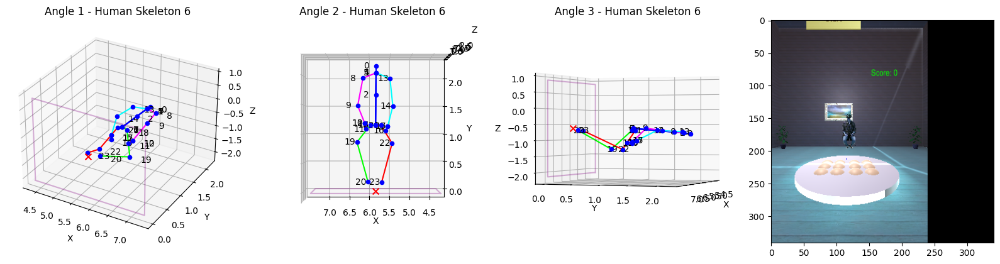

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np
import cv2 as cv

# List of bones to connect between joints with color mapping
bones = {
    'spine': [(0, 1), (1, 2), (2, 3), (3, 4),(3,6),(3,7), (4,5), (5,6), (6,7)],  # Spine and head
    'right_arm': [(4,8),(8,9), (9,10), (10,11), (11,12)],  # Right arm
    'left_arm': [(5,13),(13,14), (14,15), (15,16), (16,17)],  # Left arm
    'right_leg': [(6,18),(18,19), (19,20)],  # Right leg
    'left_leg': [(7,21),(21,22), (22,23)]  # Left leg
}

# Color mapping for each limb
limb_colors = {
    'spine': 'blue',
    'right_arm': 'fuchsia',
    'left_arm': 'cyan',
    'right_leg': 'lime',
    'left_leg': 'red'
}

def calculate_angle(joint_a, joint_b, joint_c):
    """
    Calculate the angle between the vector AB and BC where A, B, and C are joints.

    Parameters:
    - joint_a: Coordinates of joint A.
    - joint_b: Coordinates of joint B (the vertex).
    - joint_c: Coordinates of joint C.

    Returns:
    - angle: Angle in degrees between the two vectors.
    """
    vec_ab = np.array(joint_a) - np.array(joint_b)
    vec_bc = np.array(joint_c) - np.array(joint_b)
    cosine_angle = np.dot(vec_ab, vec_bc) / (np.linalg.norm(vec_ab) * np.linalg.norm(vec_bc))
    angle = np.arccos(cosine_angle)
    return np.degrees(angle)

def plot_skeleton_and_floor_from_dataframe(df, index):
    """
    Plots the skeleton and floor from a specific row in the DataFrame in three different views.

    Parameters:
    - df: DataFrame containing the data.
    - index: Row index to plot.
    """

    # Extract the row
    row = df.iloc[index]

    # Extract the ID
    id = row['GlobalID']

    # Extract floor height, and plot it under the skeleton
    # use Skeleton3 - pelvis as anchor
    floor_positions = (row['Skeleton3_X'], row['Floor_Y'], row['Skeleton3_Z'])

    # Extract x, y, z coordinates from skeleton_positions
    x = [float(row[f'Skeleton{i}_X']) for i in range(24)]
    y = [float(row[f'Skeleton{i}_Y']) for i in range(24)]
    z = [float(row[f'Skeleton{i}_Z']) for i in range(24)]

    # Create a figure with 3 subplots
    fig = plt.figure(figsize=(16, 4))

    # Plot the first view (default)
    ax1 = fig.add_subplot(141, projection='3d')
    plot_skeleton(ax1, x, y, z, bones, floor_positions, title=f'Angle 1 - Human Skeleton {id}')

    # Plot the second view
    ax2 = fig.add_subplot(142, projection='3d')
    ax2.view_init(elev=-90, azim=90)
    plot_skeleton(ax2, x, y, z, bones, floor_positions, title=f'Angle 2 - Human Skeleton {id}')

    # Plot the third view
    ax3 = fig.add_subplot(143, projection='3d')
    ax3.view_init(elev=0, azim=20)
    plot_skeleton(ax3, x, y, z, bones, floor_positions, title=f'Angle 3 - Human Skeleton {id}')

    # Plot the image
    ax4 = fig.add_subplot(144)
    print(row['EntryID'])
    img = cv.imread('/content/drive/MyDrive/VR_AR_testing/Data_Logger_and_Scripts/data/pianoTiles/image_log/' + row['EntryID'] +'.png' )
    ax4.imshow(img)

    plt.tight_layout()
    plt.show()

def plot_skeleton(ax, x, y, z, bones, floor_positions, title):
    """
    Helper function to plot skeleton and floor on a given axis.

    Parameters:
    - ax: The axis to plot on.
    - x, y, z: Coordinates of the skeleton joints.
    - bones: List of bone pairs (tuples).
    - floor_positions: Tuple containing the floor positions (x, y, z).
    - title: Title for the plot.
    """

    offset = 0.3  # Adjust the offset for better readability

    given_angle = 90  # Set the given knee angle in degrees to plot the leg positions

    # Plot joints as scatter points with annotations
    for i in range(len(x)):
        ax.scatter(x[i], y[i], z[i], color='b', s=20, marker='o')
        ax.text(x[i] + offset, y[i], z[i], i, color='black', fontsize=10, ha='left', va='center')

    # Plot bones as lines between joints with color coding
    for limb, limb_bones in bones.items():
        color = limb_colors[limb]
        for bone in limb_bones:
            joint_from = bone[0]
            joint_to = bone[1]
            ax.plot([x[joint_from], x[joint_to]], [y[joint_from], y[joint_to]], [z[joint_from], z[joint_to]], color=color)

    # Get floor position data
    floor_x = float(floor_positions[0])
    floor_y = float(floor_positions[1])
    floor_z = float(floor_positions[2])

    # Define floor dimensions (adjust based on your data)
    floor_width = 3.0  # Adjust width of the floor
    floor_depth = 3.0  # Adjust depth of the floor

    # Calculate square floor corner coordinates (centered at floor position)
    floor_x_min = floor_x - floor_width / 2
    floor_x_max = floor_x + floor_width / 2
    floor_z_min = floor_z - floor_depth / 2
    floor_z_max = floor_z + floor_depth / 2

    # Plot the floor square as a rectangle with four lines (on the X-Z plane)
    ax.plot([floor_x_min, floor_x_min, floor_x_max, floor_x_max, floor_x_min],
            [floor_y, floor_y, floor_y, floor_y, floor_y],
            [floor_z_min, floor_z_max, floor_z_max, floor_z_min, floor_z_min], color='purple', alpha=0.3)

    ax.scatter(floor_x, floor_y, floor_z, color='r', s=50, marker='x')

    # Calculate and plot extra lines for the legs
    # Right knee (18:hip, 19:knee, 20:ankle)
    right_knee_angle = calculate_angle((x[18], y[18], z[18]), (x[19], y[19], z[19]), (x[20], y[20], z[20]))
    if right_knee_angle > given_angle:
        leg_length = np.linalg.norm([x[20] - x[19], y[20] - y[19], z[20] - z[19]])
        knee_x, knee_y, knee_z = x[19], y[19], z[19]
        floor_y = y[19] - leg_length
        ax.plot([knee_x, knee_x], [knee_y, floor_y], [knee_z, knee_z], color='orange', linestyle='--', label='Right Leg Line')

    # Left knee (21:hip, 22:knee, 23:ankle)
    left_knee_angle = calculate_angle((x[21], y[21], z[21]), (x[22], y[22], z[22]), (x[23], y[23], z[23]))
    if left_knee_angle > given_angle:
        leg_length = np.linalg.norm([x[23] - x[22], y[23] - y[22], z[23] - z[22]])
        knee_x, knee_y, knee_z = x[22], y[22], z[22]
        floor_y = y[22] - leg_length
        ax.plot([knee_x, knee_x], [knee_y, floor_y], [knee_z, knee_z], color='orange', linestyle='--', label='Left Leg Line')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)

index = 5  # Replace with the actual index you want to plot
plot_skeleton_and_floor_from_dataframe(df, index)


09182024053601427


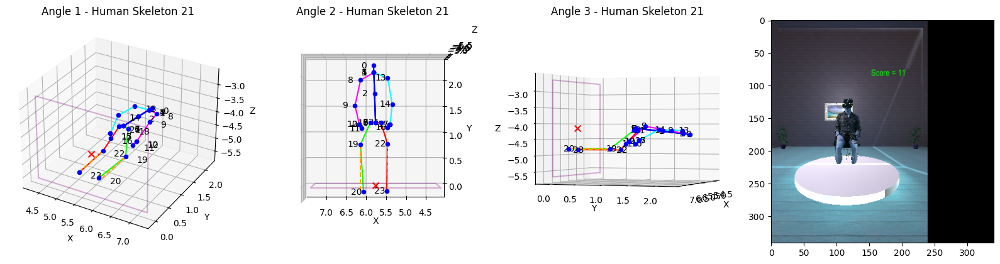

09182024053601427


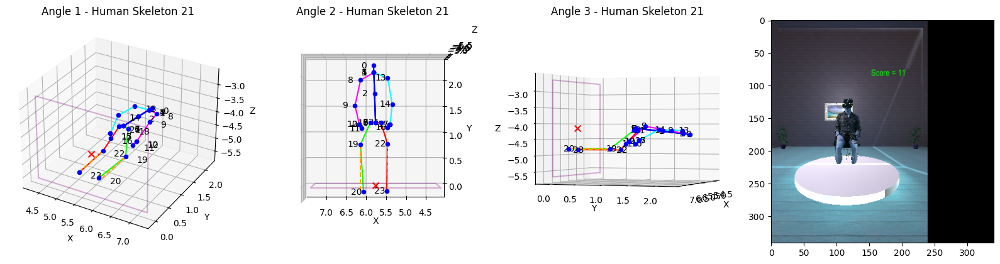

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np
import cv2 as cv

# List of bones to connect between joints with color mapping
bones = {
    'spine': [(0, 1), (1, 2), (2, 3), (3, 4),(3,6),(3,7), (4,5), (5,6), (6,7)],  # Spine and head
    'right_arm': [(4,8),(8,9), (9,10), (10,11), (11,12)],  # Right arm
    'left_arm': [(5,13),(13,14), (14,15), (15,16), (16,17)],  # Left arm
    'right_leg': [(6,18),(18,19), (19,20)],  # Right leg
    'left_leg': [(7,21),(21,22), (22,23)]  # Left leg
}

# Color mapping for each limb
limb_colors = {
    'spine': 'blue',
    'right_arm': 'fuchsia',
    'left_arm': 'cyan',
    'right_leg': 'lime',
    'left_leg': 'red'
}

def calculate_angle(joint_a, joint_b, joint_c):
    """
    Calculate the angle between the vector AB and BC where A, B, and C are joints.

    Parameters:
    - joint_a: Coordinates of joint A.
    - joint_b: Coordinates of joint B (the vertex).
    - joint_c: Coordinates of joint C.

    Returns:
    - angle: Angle in degrees between the two vectors.
    """
    vec_ab = np.array(joint_a) - np.array(joint_b)
    vec_bc = np.array(joint_c) - np.array(joint_b)
    cosine_angle = np.dot(vec_ab, vec_bc) / (np.linalg.norm(vec_ab) * np.linalg.norm(vec_bc))
    angle = np.arccos(cosine_angle)
    return np.degrees(angle)

def plot_skeleton_and_cylinder_from_dataframe(df, index):
    """
    Plots the skeleton and floor from a specific row in the DataFrame in three different views.

    Parameters:
    - df: DataFrame containing the data.
    - index: Row index to plot.
    """

    # Extract the row
    row = df.iloc[index]

    # Extract the ID
    id = row['GlobalID']

    # Extract floor height, and plot it under the skeleton
    # use Skeleton3 - pelvis as anchor
    floor_positions = (row['Skeleton3_X'], row['Floor_Y'], row['Skeleton3_Z'])

    # Extract x, y, z coordinates from skeleton_positions
    x = [float(row[f'Skeleton{i}_X']) for i in range(24)]
    y = [float(row[f'Skeleton{i}_Y']) for i in range(24)]
    z = [float(row[f'Skeleton{i}_Z']) for i in range(24)]

    # Create a figure with 3 subplots
    fig = plt.figure(figsize=(16, 4))

    # Plot the first view (default)
    ax1 = fig.add_subplot(141, projection='3d')
    plot_skeleton(ax1, x, y, z, bones, floor_positions, title=f'Angle 1 - Human Skeleton {id}')

    # Plot the second view
    ax2 = fig.add_subplot(142, projection='3d')
    ax2.view_init(elev=-90, azim=90)
    plot_skeleton(ax2, x, y, z, bones, floor_positions, title=f'Angle 2 - Human Skeleton {id}')

    # Plot the third view
    ax3 = fig.add_subplot(143, projection='3d')
    ax3.view_init(elev=0, azim=20)
    plot_skeleton(ax3, x, y, z, bones, floor_positions, title=f'Angle 3 - Human Skeleton {id}')

    # Plot the image
    ax4 = fig.add_subplot(144)
    print(row['EntryID'])
    img = cv.imread('/content/drive/MyDrive/VR_AR_testing/Data_Logger_and_Scripts/data/pianoTiles/image_log/' + row['EntryID'] +'.png' )
    ax4.imshow(img)

    plt.tight_layout()
    plt.show()

def plot_skeleton(ax, x, y, z, bones, floor_positions, title):
    """
    Helper function to plot skeleton and floor on a given axis.

    Parameters:
    - ax: The axis to plot on.
    - x, y, z: Coordinates of the skeleton joints.
    - bones: List of bone pairs (tuples).
    - floor_positions: Tuple containing the floor positions (x, y, z).
    - title: Title for the plot.
    """

    offset = 0.3  # Adjust the offset for better readability

    given_angle = 90  # Set the given knee angle in degrees to plot the leg positions

    # Plot joints as scatter points with annotations
    for i in range(len(x)):
        ax.scatter(x[i], y[i], z[i], color='b', s=20, marker='o')
        ax.text(x[i] + offset, y[i], z[i], i, color='black', fontsize=10, ha='left', va='center')

    # Plot bones as lines between joints with color coding
    for limb, limb_bones in bones.items():
        color = limb_colors[limb]
        for bone in limb_bones:
            joint_from = bone[0]
            joint_to = bone[1]
            ax.plot([x[joint_from], x[joint_to]], [y[joint_from], y[joint_to]], [z[joint_from], z[joint_to]], color=color)

    # Get floor position data
    floor_x = float(floor_positions[0])
    floor_y = float(floor_positions[1])
    floor_z = float(floor_positions[2])

    # Define floor dimensions (adjust based on your data)
    floor_width = 3.0  # Adjust width of the floor
    floor_depth = 3.0  # Adjust depth of the floor

    # Calculate square floor corner coordinates (centered at floor position)
    floor_x_min = floor_x - floor_width / 2
    floor_x_max = floor_x + floor_width / 2
    floor_z_min = floor_z - floor_depth / 2
    floor_z_max = floor_z + floor_depth / 2

    # Plot the floor square as a rectangle with four lines (on the X-Z plane)
    ax.plot([floor_x_min, floor_x_min, floor_x_max, floor_x_max, floor_x_min],
            [floor_y, floor_y, floor_y, floor_y, floor_y],
            [floor_z_min, floor_z_max, floor_z_max, floor_z_min, floor_z_min], color='purple', alpha=0.3)

    ax.scatter(floor_x, floor_y, floor_z, color='r', s=50, marker='x')

    # Calculate and plot extra lines for the legs
    # Right knee (18:hip, 19:knee, 20:ankle)
    right_knee_angle = calculate_angle((x[18], y[18], z[18]), (x[19], y[19], z[19]), (x[20], y[20], z[20]))
    if right_knee_angle > given_angle:
        leg_length = np.linalg.norm([x[20] - x[19], y[20] - y[19], z[20] - z[19]])
        knee_x, knee_y, knee_z = x[19], y[19], z[19]
        floor_y = y[19] - leg_length
        ax.plot([knee_x, knee_x], [knee_y, floor_y], [knee_z, knee_z], color='orange', linestyle='--', label='Right Leg Line')

    # Left knee (21:hip, 22:knee, 23:ankle)
    left_knee_angle = calculate_angle((x[21], y[21], z[21]), (x[22], y[22], z[22]), (x[23], y[23], z[23]))
    if left_knee_angle > given_angle:
        leg_length = np.linalg.norm([x[23] - x[22], y[23] - y[22], z[23] - z[22]])
        knee_x, knee_y, knee_z = x[22], y[22], z[22]
        floor_y = y[22] - leg_length
        ax.plot([knee_x, knee_x], [knee_y, floor_y], [knee_z, knee_z], color='orange', linestyle='--', label='Left Leg Line')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)

index = 20  # Replace with the actual index you want to plot
plot_skeleton_and_cylinder_from_dataframe(df, index)
plot_skeleton_and_floor_from_dataframe(df, index)


In [ ]:
df[df['EntryID']=='09182024053551961']

,GlobalID,EntryID,Skeleton0_X,Skeleton0_Y,Skeleton0_Z,Skeleton1_X,Skeleton1_Y,Skeleton1_Z,Skeleton2_X,Skeleton2_Y,...,Sphere 12_X,Sphere 12_Y,Sphere 12_Z,Floor_X,Floor_Y,Floor_Z,Spatial,Temporal,Spatial_2,Temporal_2
1,2,09182024053551961,5.791459,1.536304,-2.278982,5.798611,1.465669,-2.150981,5.821753,1.249716,...,5.068611,0.1027963,-4.787522,5.800001,0,-5.19,0,0,0,0


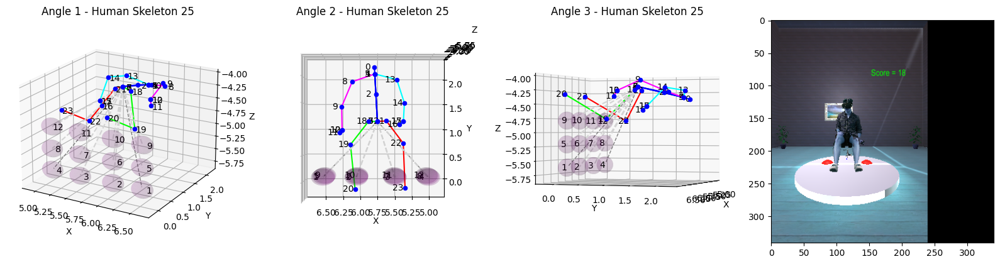

In [ ]:
import re

# Assuming bubble_radius is defined
bubble_radius = 0.159

def distance(joint1, joint2):
    return np.linalg.norm(np.array(joint1) - np.array(joint2))

def get_total_reach(joint_positions):
    # Define the key bones
    skeleton_bones = {
        'upper_arm_left': distance(joint_positions['Skeleton14'], joint_positions['Skeleton13']),
        'forearm_left': distance(joint_positions['Skeleton15'], joint_positions['Skeleton14']),
        'upper_arm_right': distance(joint_positions['Skeleton9'], joint_positions['Skeleton8']),
        'forearm_right': distance(joint_positions['Skeleton10'], joint_positions['Skeleton9']),
        'thigh_left': distance(joint_positions['Skeleton22'], joint_positions['Skeleton21']),
        'lower_leg_left': distance(joint_positions['Skeleton23'], joint_positions['Skeleton22']),
        'thigh_right': distance(joint_positions['Skeleton19'], joint_positions['Skeleton18']),
        'lower_leg_right': distance(joint_positions['Skeleton20'], joint_positions['Skeleton19']),
        'hip_right': distance(joint_positions['Skeleton3'], joint_positions['Skeleton18']),
        'hip_left': distance(joint_positions['Skeleton3'], joint_positions['Skeleton21']),
        'shoulder_left': distance(joint_positions['Skeleton8'], joint_positions['Skeleton4']),
        'shoulder_right': distance(joint_positions['Skeleton13'], joint_positions['Skeleton4']),
        'neck': distance(joint_positions['Skeleton0'], joint_positions['Skeleton1']),
        'spine': distance(joint_positions['Skeleton1'], joint_positions['Skeleton3'])
    }

    # Calculate the total reach (hip + thigh + lower leg)
    reach_left = skeleton_bones['hip_left'] + skeleton_bones['thigh_left'] + skeleton_bones['lower_leg_left']
    reach_right = skeleton_bones['hip_right'] + skeleton_bones['thigh_right'] + skeleton_bones['lower_leg_right']
    total_reach = max(reach_left, reach_right)

    return total_reach

def plot_skeleton_and_spheres_with_reach_from_dataframe(df, index):
    """
    Plots the skeleton and spheres with reach from a specific row in the DataFrame in three different views.

    Parameters:
    - df: DataFrame containing the data.
    - index: Row index to plot.
    """

    # Extract the row
    row = df.iloc[index]

    # Extract the ID
    id = row['GlobalID']

    # Extract skeleton positions
    skeleton_positions = {f'Skeleton{i}': (float(row[f'Skeleton{i}_X']), float(row[f'Skeleton{i}_Y']), float(row[f'Skeleton{i}_Z'])) for i in range(24)}

    # Extract sphere positions
    sphere_positions = {
        'Sphere1': (float(row['Sphere 1_X']), float(row['Sphere 1_Y']), float(row['Sphere 1_Z'])),
        'Sphere2': (float(row['Sphere 2_X']), float(row['Sphere 2_Y']), float(row['Sphere 2_Z'])),
        'Sphere3': (float(row['Sphere 3_X']), float(row['Sphere 3_Y']), float(row['Sphere 3_Z'])),
        'Sphere4': (float(row['Sphere 4_X']), float(row['Sphere 4_Y']), float(row['Sphere 4_Z'])),
        'Sphere5': (float(row['Sphere 5_X']), float(row['Sphere 5_Y']), float(row['Sphere 5_Z'])),
        'Sphere6': (float(row['Sphere 6_X']), float(row['Sphere 6_Y']), float(row['Sphere 6_Z'])),
        'Sphere7': (float(row['Sphere 7_X']), float(row['Sphere 7_Y']), float(row['Sphere 7_Z'])),
        'Sphere8': (float(row['Sphere 8_X']), float(row['Sphere 8_Y']), float(row['Sphere 8_Z'])),
        'Sphere9': (float(row['Sphere 9_X']), float(row['Sphere 9_Y']), float(row['Sphere 9_Z'])),
        'Sphere10': (float(row['Sphere 10_X']), float(row['Sphere 10_Y']), float(row['Sphere 10_Z'])),
        'Sphere11': (float(row['Sphere 11_X']), float(row['Sphere 11_Y']), float(row['Sphere 11_Z'])),
        'Sphere12': (float(row['Sphere 12_X']), float(row['Sphere 12_Y']), float(row['Sphere 12_Z']))
    }

    fig = plt.figure(figsize=(16, 4))

    # Plot the first view (default)
    ax1 = fig.add_subplot(141, projection='3d')
    plot_skeleton_and_spheres(ax1, skeleton_positions, sphere_positions, title=f'Angle 1 - Human Skeleton {id}')

    # Plot the second view
    ax2 = fig.add_subplot(142, projection='3d')
    plot_skeleton_and_spheres(ax2, skeleton_positions, sphere_positions, title=f'Angle 2 - Human Skeleton {id}', elev=-90, azim=90)

    # Plot the third view
    ax3 = fig.add_subplot(143, projection='3d')
    plot_skeleton_and_spheres(ax3, skeleton_positions, sphere_positions, title=f'Angle 3 - Human Skeleton {id}', elev=0, azim=20)

    # Plot the image
    ax4 = fig.add_subplot(144)
    img = cv.imread('/content/drive/MyDrive/VR_AR_testing/Data_Logger_and_Scripts/data/pianoTiles/image_log/' + row['EntryID'] + '.png')
    ax4.imshow(img)

    plt.tight_layout()
    plt.show()

def plot_skeleton_and_spheres(ax, skeleton_positions, sphere_positions, title, elev=20, azim=-60):
    def plot_sphere(ax, center, radius):
        u = np.linspace(0, 2 * np.pi, 100)
        v = np.linspace(0, np.pi, 100)
        x = center[0] + radius * np.outer(np.cos(u), np.sin(v))
        y = center[1] + radius * np.outer(np.sin(u), np.sin(v))
        z = center[2] + radius * np.outer(np.ones(np.size(u)), np.cos(v))
        ax.plot_surface(x, y, z, color='purple', alpha=0.1)

    def plot_reach_line(ax, start, end, reach, sphere_radius=bubble_radius):
        total_length = np.linalg.norm(np.array(start) - np.array(end))

        if total_length <= reach:
            ax.plot([start[0], end[0]], [start[1], end[1]], [start[2], end[2]], color='lightgray', linestyle='--')
        else:
            scale_factor = reach / total_length
            reachable_point = start + scale_factor * (np.array(end) - np.array(start))
            color = 'gray'
            line_width = 1.0
            if total_length > reach + sphere_radius:
                color = 'orange'
                line_width = 2.0
            ax.plot([start[0], reachable_point[0]], [start[1], reachable_point[1]], [start[2], reachable_point[2]], color=color, linestyle='--', linewidth=line_width )

    # Extract x, y, z coordinates from skeleton_positions
    x = [pos[0] for pos in skeleton_positions.values()]
    y = [pos[1] for pos in skeleton_positions.values()]
    z = [pos[2] for pos in skeleton_positions.values()]

    offset = 0.1  # Adjust the offset for better readability

    # Plot joints as scatter points with annotations
    for i in range(len(x)):
        ax.scatter(x[i], y[i], z[i], color='b', s=20, marker='o')
        ax.text(x[i] + offset, y[i], z[i], i, color='black', fontsize=10, ha='center', va='center')

    # Plot bones as lines between joints with color coding
    for limb, limb_bones in bones.items():
        color = limb_colors[limb]
        for bone in limb_bones:
            joint_from = bone[0]
            joint_to = bone[1]
            ax.plot([x[joint_from], x[joint_to]], [y[joint_from], y[joint_to]], [z[joint_from], z[joint_to]], color=color)

    # Calculate the total reach of the skeleton
    total_reach = get_total_reach(skeleton_positions)

    # Plot Spheres
    for key, pos in sphere_positions.items():
        ax.text(pos[0] + offset, pos[1], pos[2], re.sub(r'[^\d]',"",key) , fontsize=10, ha='center', va='center')
        plot_sphere(ax, pos, bubble_radius)

        # Plot a line from Skeleton3 to the center of each sphere
        plot_reach_line(ax, skeleton_positions['Skeleton3'], pos, total_reach)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)

    # Rotate the view angles to adjust the orientation
    ax.view_init(elev=elev, azim=azim)


# Example usage:
index = 24  # Replace with the actual index you want to plot
plot_skeleton_and_spheres_with_reach_from_dataframe(df, index)


# Interactive labeling functions

**TODO:** please make sure your assigned label column is displayed in




In [ ]:
from ipywidgets import widgets

import gspread
from gspread_dataframe import set_with_dataframe


def interactive_plot_and_label(df, index):

    # Fetch values from the DataFrame, ensuring they are in the correct format
    #spatial_value = str(df.loc[index, 'Spatial'])

    def on_button_click(b):
        # Change the color of the button
        b.style.button_color = 'lightgreen'

        # Update the DataFrame based on the selected labels

        # todo: change assigned label column for Spatial label (e.g. Spatial_1, Spatial_2)
        df.loc[index, 'Spatial'] = int(label_spatial.value)  # Convert to int

        # Update Google Sheets with the new DataFrame
        set_with_dataframe(worksheet, df)
        print(f"Labels updated for index {index} with {label_spatial.value}.")

    # Plot the skeleton and floor
    plot_skeleton_and_floor_from_dataframe(df, index)

    label_spatial = widgets.RadioButtons(
        options=[('0', '0'), ('1', '1')],
        description='Spatial:'
    )


    button = widgets.Button(description="Update Labels")
    button.on_click(on_button_click)

    # Display in a row using HBox
    display(label_spatial, button)



**TODO:** please make sure your assigned label column is displayed in

*   List item
*   List item




In [ ]:
from ipywidgets import widgets

import gspread
from gspread_dataframe import set_with_dataframe


def interactive_plot_and_label_spheres(df, index):

    def on_button_click(b):
        # Change the color of the button
        b.style.button_color = 'lightgreen'

        # Update the DataFrame based on the selected labels
        # todo: change the label column to the assigned column for the Temporal label ( e.g. Temporal_1, Temporal_2)
        df.loc[index, 'Temporal'] = int(label_temporal.value)  # Convert to int

        # Update Google Sheets with the new DataFrame
        set_with_dataframe(worksheet, df)
        print(f"Labels updated for index {index}.")

    # Plot the skeleton and floor
    plot_skeleton_and_spheres_with_reach_from_dataframe(df, index)

    label_temporal = widgets.RadioButtons(
        options=[('0', '0'), ('1', '1')],
        description='Temporal:'
    )

    button = widgets.Button(description="Update Labels")
    button.on_click(on_button_click)

    display(label_temporal, button)


# Usage

**Note:** Change the interval bellow according with your section.

**Note2:** When processing saving the data and getting the data for the new plots , there might be a delay. Please watch the printed comments or the data in the excel table for proof of saving the execution.

## Spatial

In [ ]:
# Plotting and labeling given rows
# max 180
for index in range(400,440):
    interactive_plot_and_label(df, int(index))

09182024054152950


KeyboardInterrupt: 

## Temporal

150


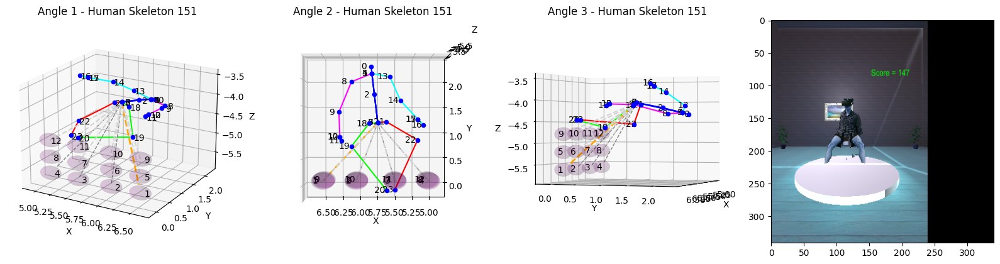

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

151


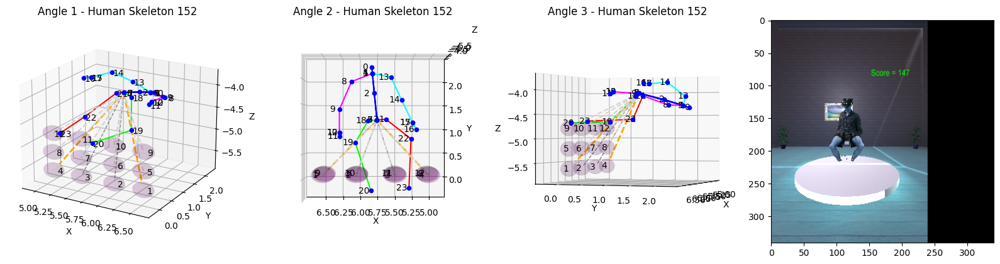

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

152


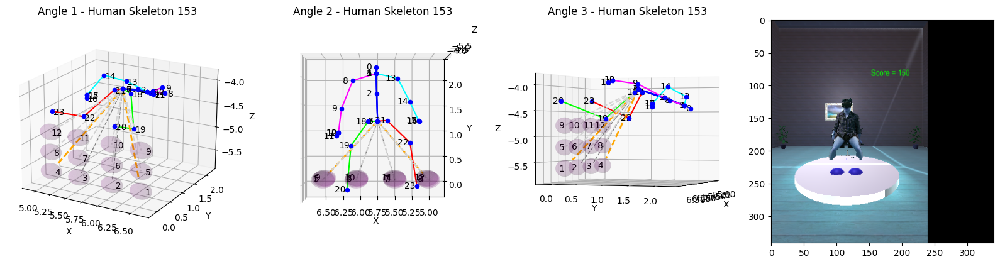

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

153


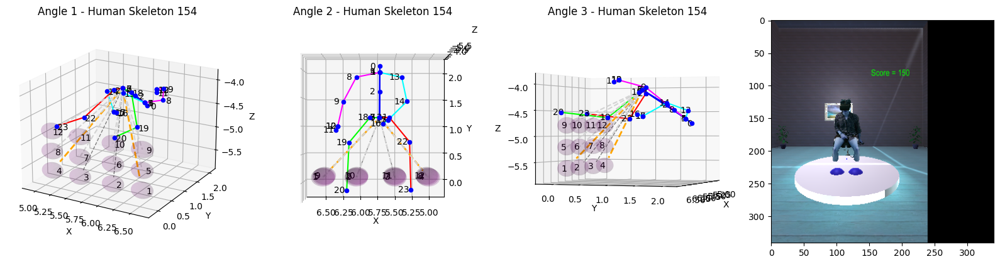

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

154


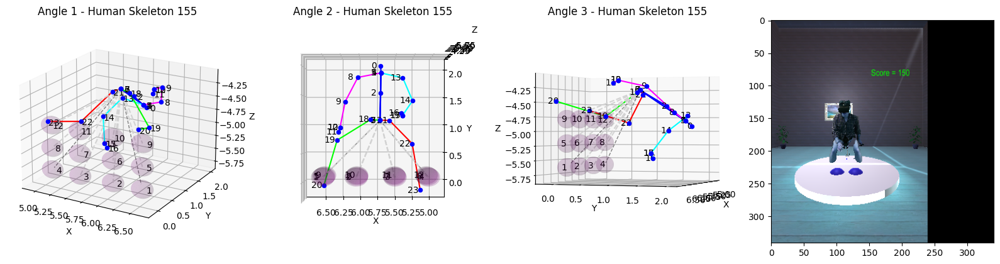

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

155


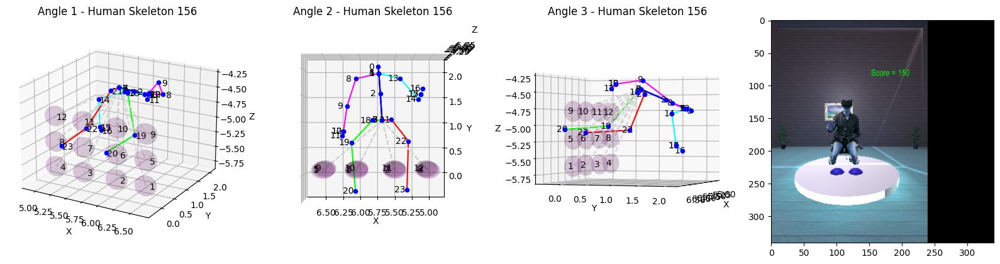

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

156


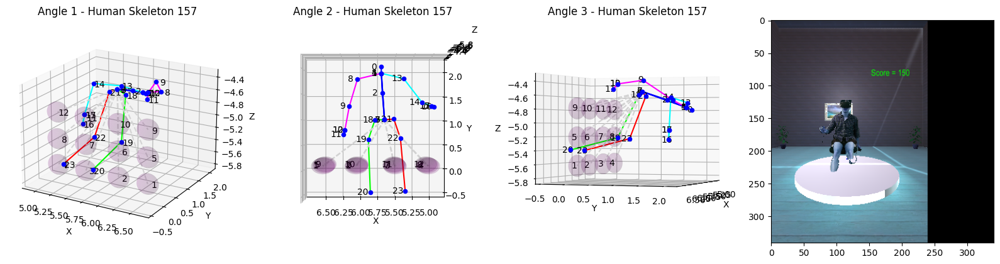

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

157


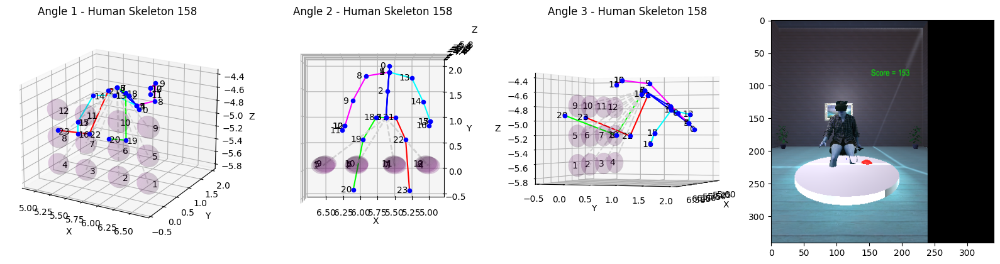

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

158


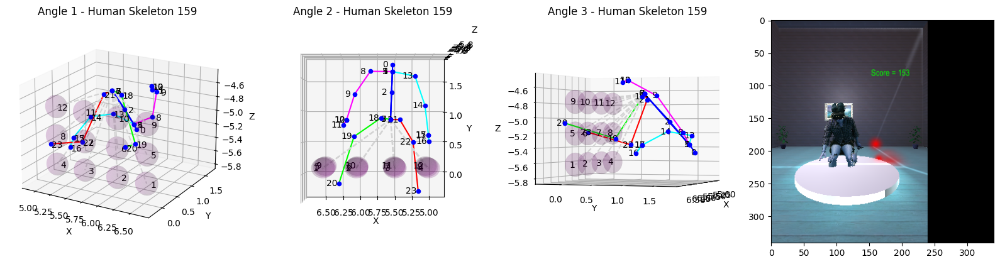

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

159


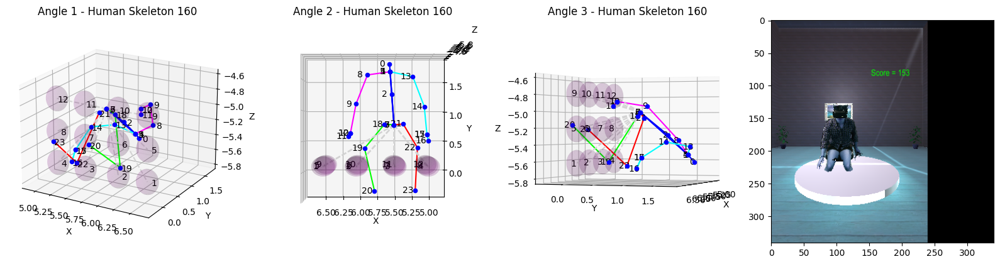

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

160


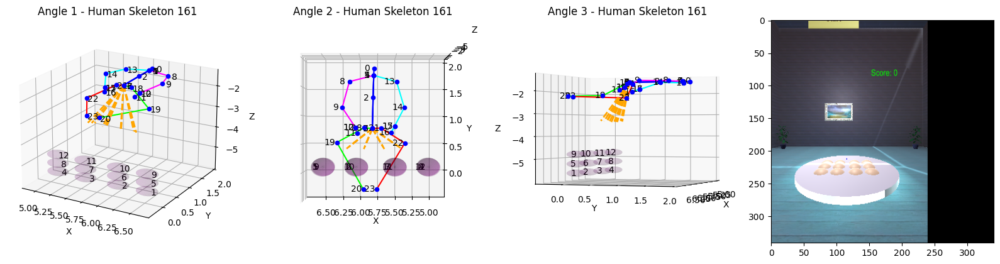

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

161


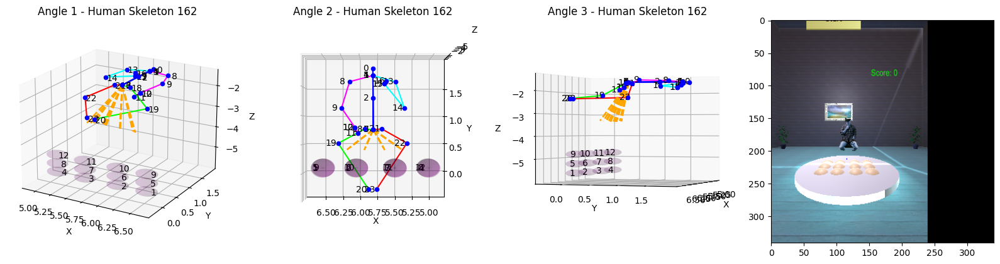

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

162


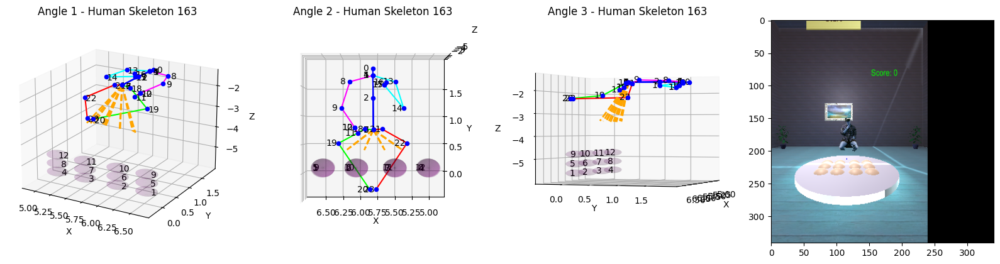

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

163


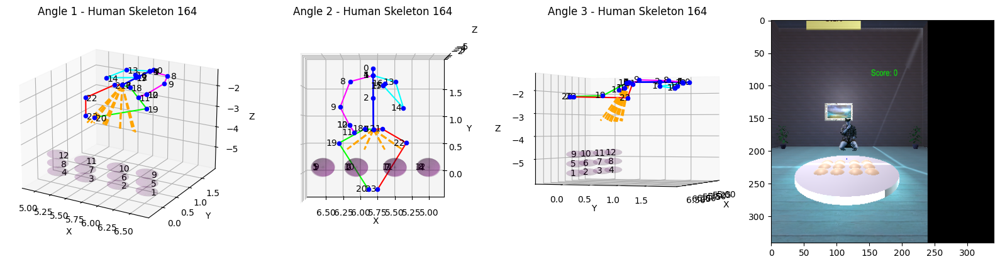

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

164


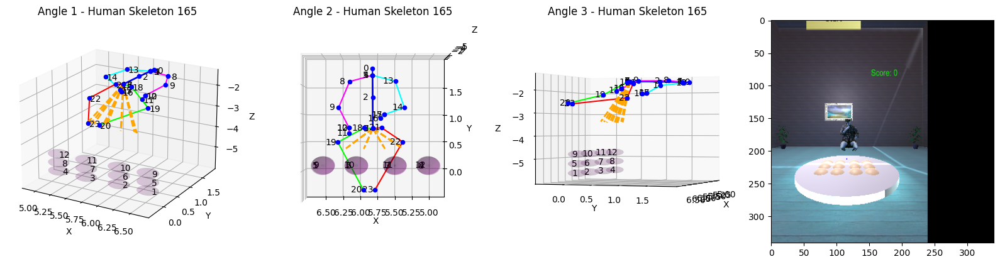

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

165


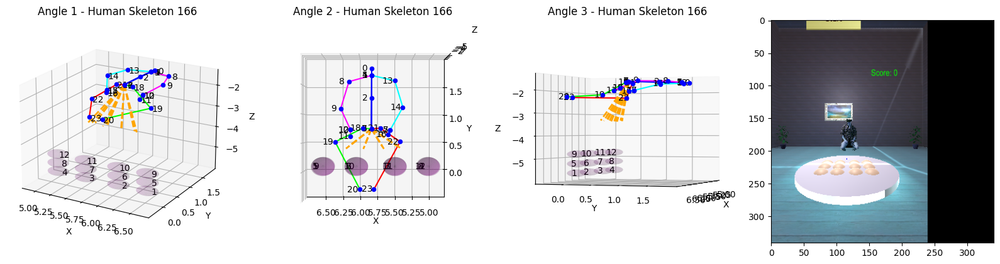

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

166


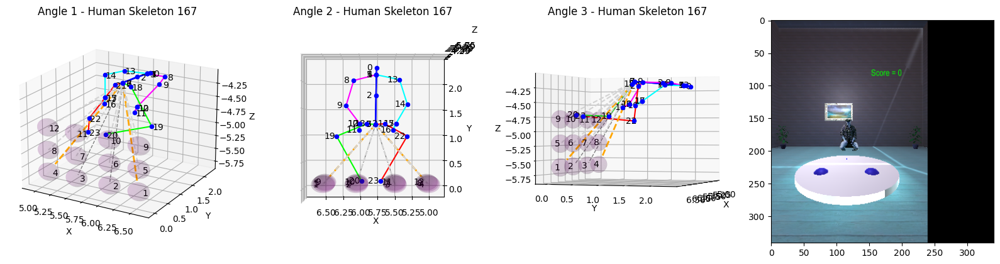

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

167


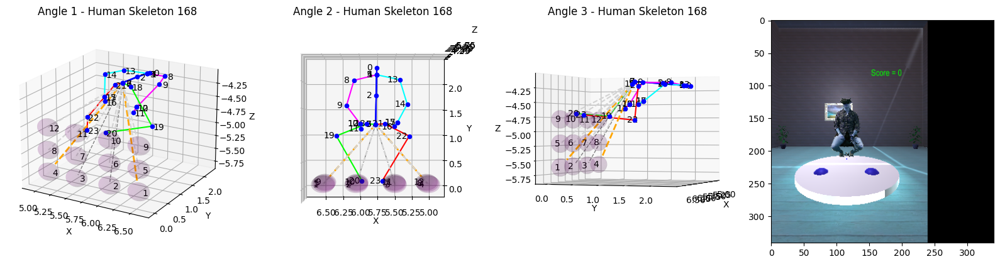

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

168


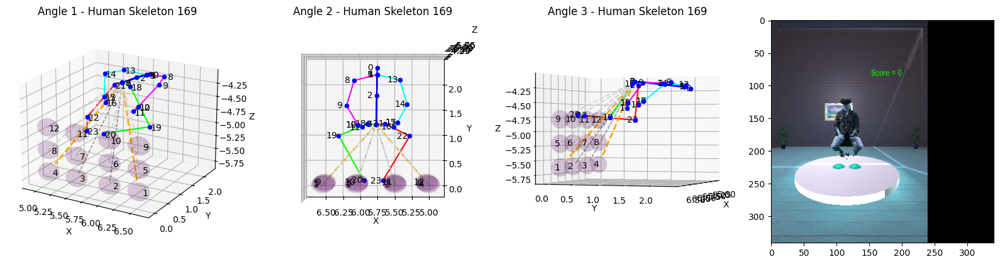

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

169


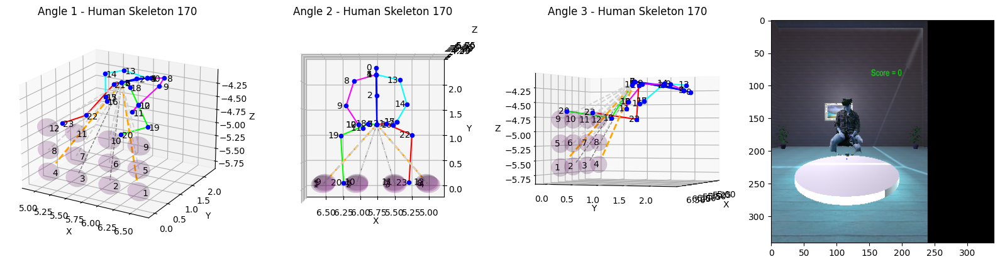

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

170


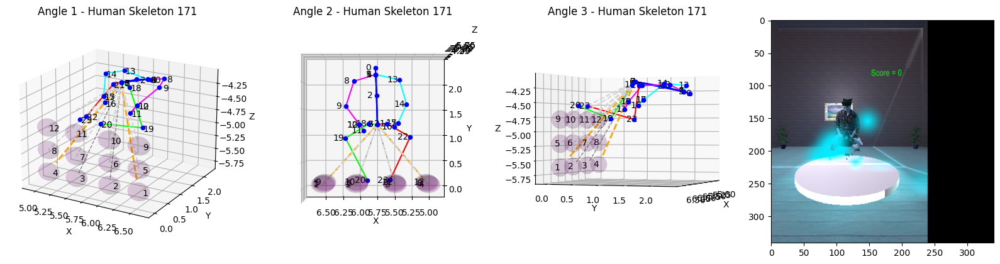

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

171


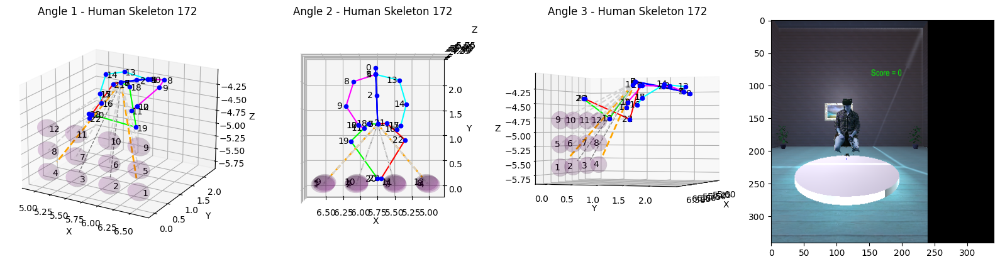

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

172


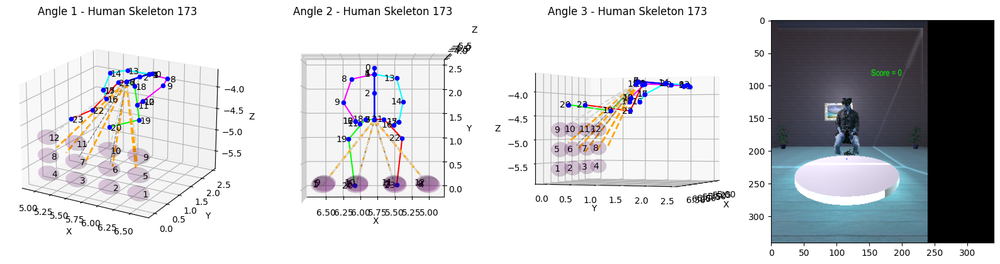

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

173


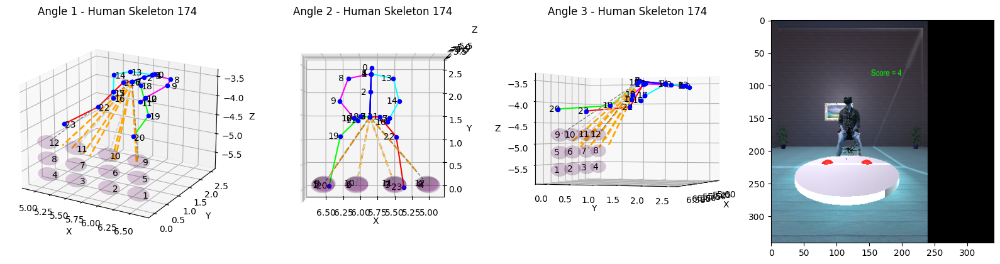

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

174


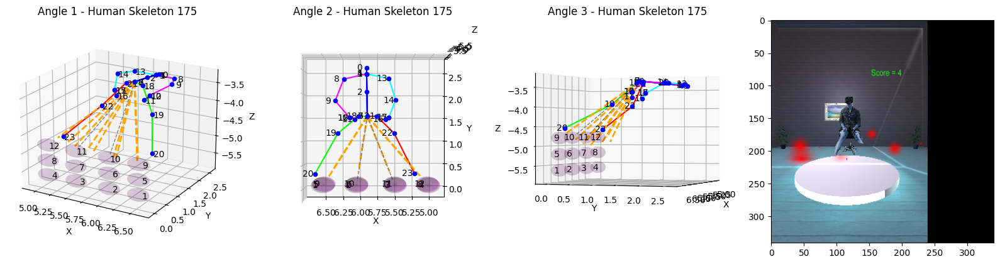

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

175


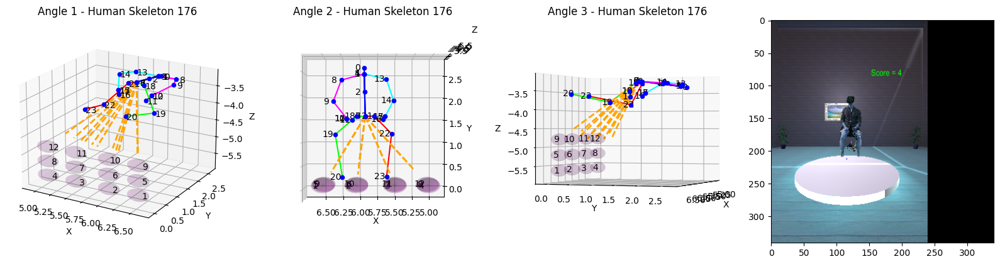

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

176


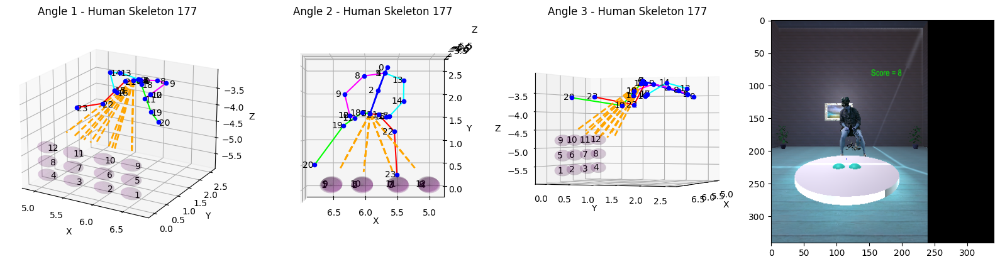

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

177


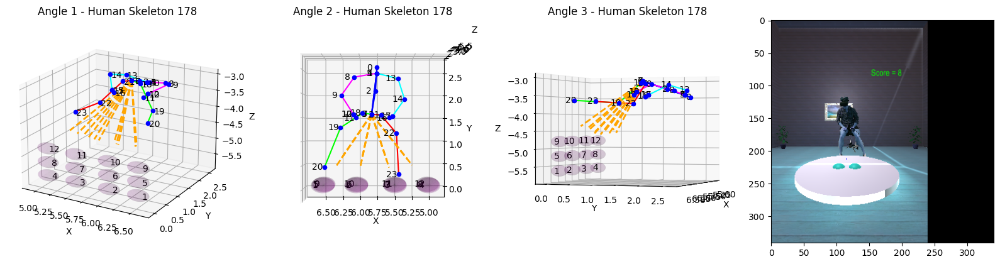

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

178


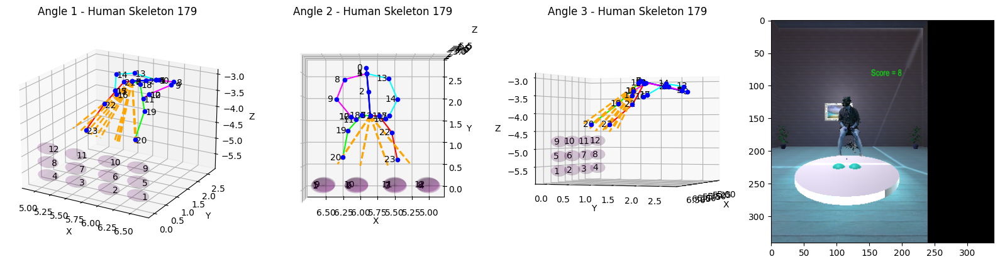

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

179


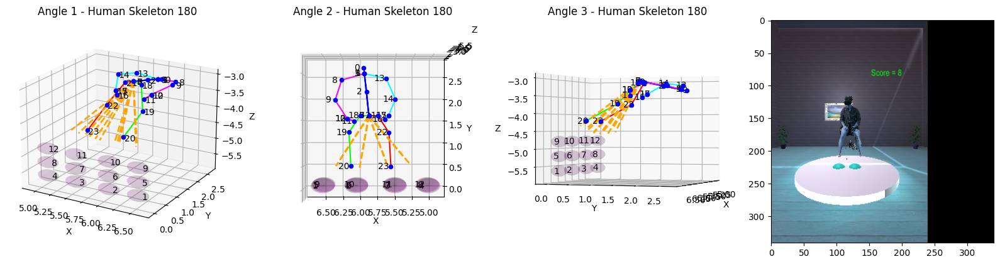

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

In [ ]:
# Plotting and labeling given rows

for index in range(150, 180):
    print(index)
    interactive_plot_and_label_spheres(df, index)

# Conflict resolution

## Spatial

In [ ]:
# Select all the conflicts between Spatial_1 and Spatial_2 columns
for index in df[df["Spatial"] != df["Spatial_2"]][:10].index:
    interactive_plot_and_label(df, int(index))


## Temporal

In [ ]:
# extract the range of indexes for the temporal conflicts
# range should include 5 indexes or more ( 2 before and 2 after)
# make continiuos ranges in the indexes of at least 5 indexes in total (2 before the index and 2 after)
df[df["Temporal"] != df["Temporal_2"]].index.tolist()

[6,
 7,
 8,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 34,
 35,
 36,
 37,
 38,
 41,
 53,
 54,
 55,
 56,
 57,
 58,
 100,
 134,
 368,
 369,
 374,
 378,
 383]

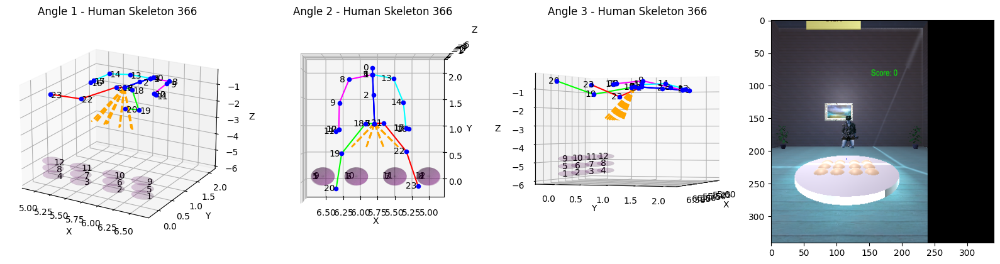

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

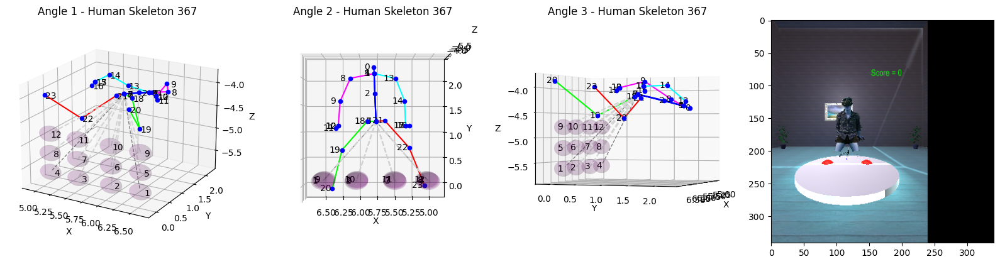

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

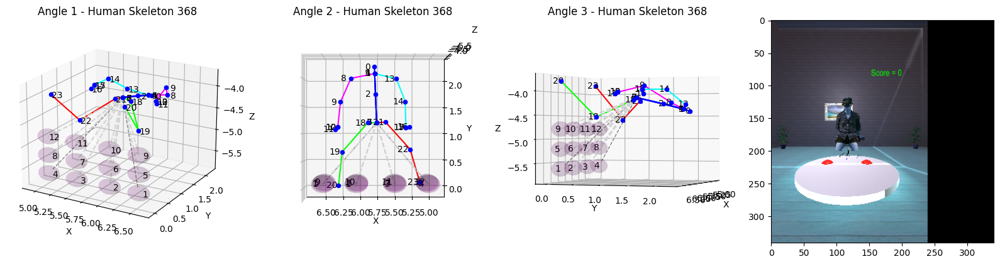

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

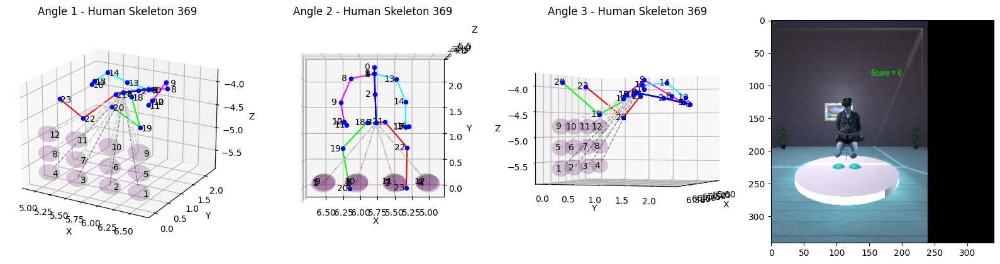

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

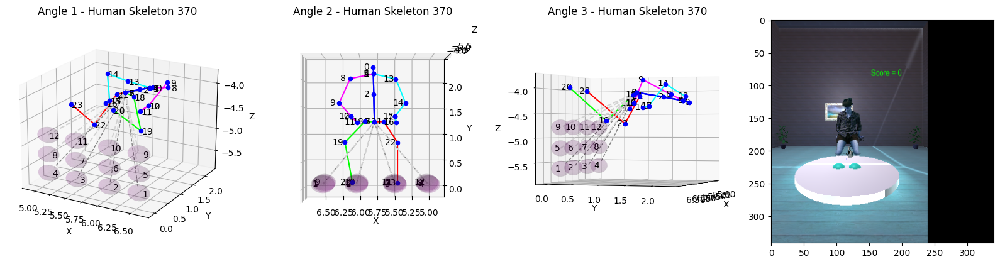

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

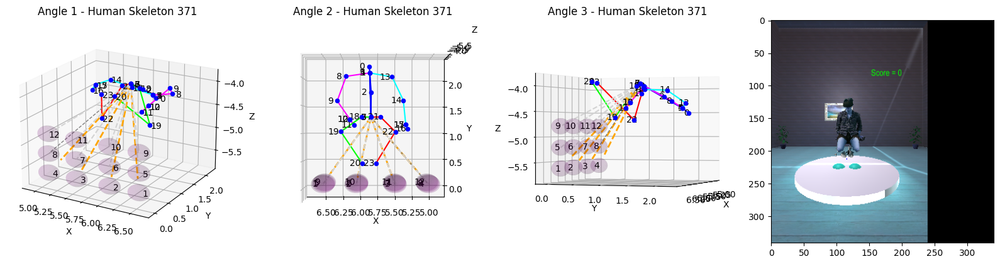

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

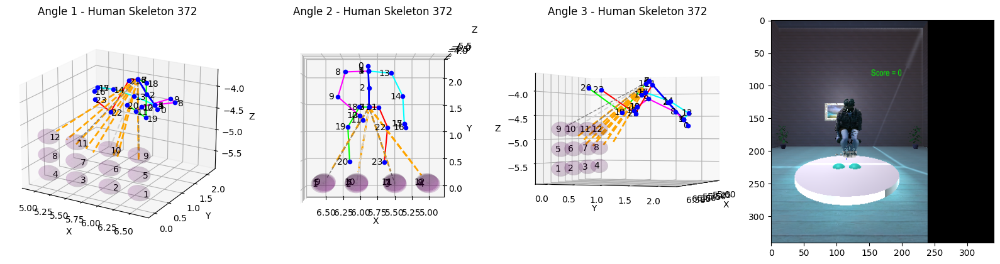

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

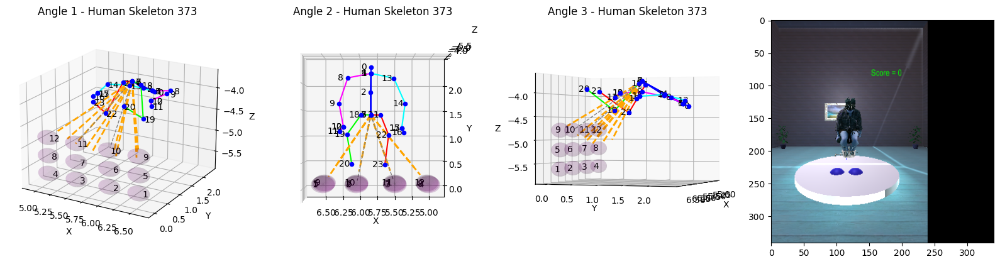

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

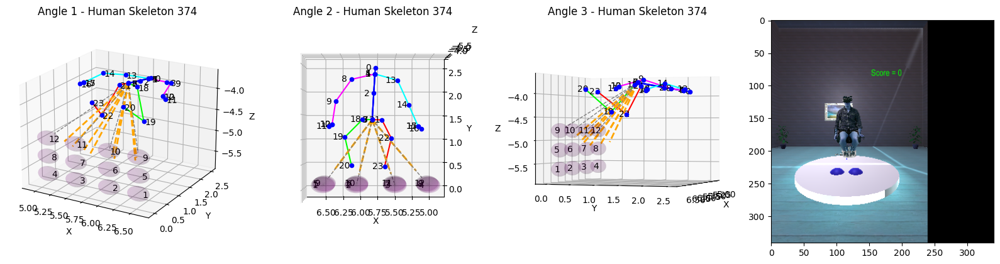

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

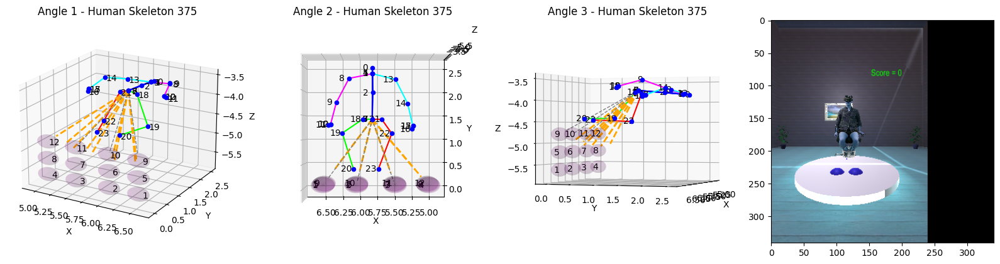

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

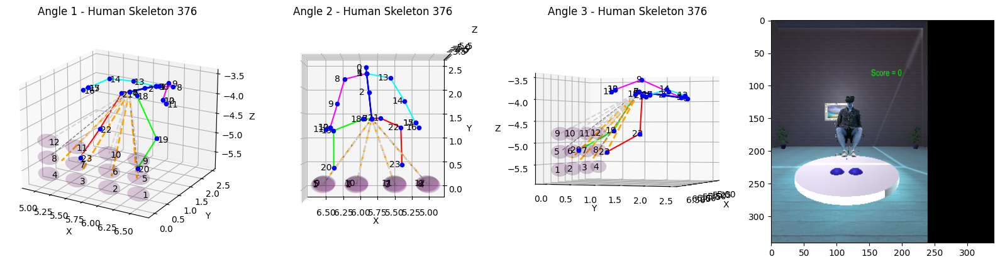

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

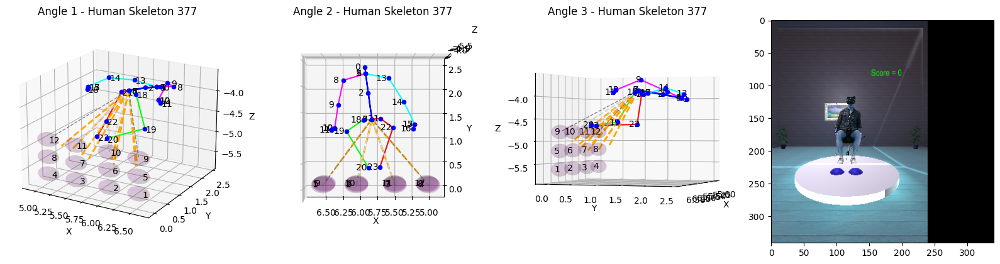

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

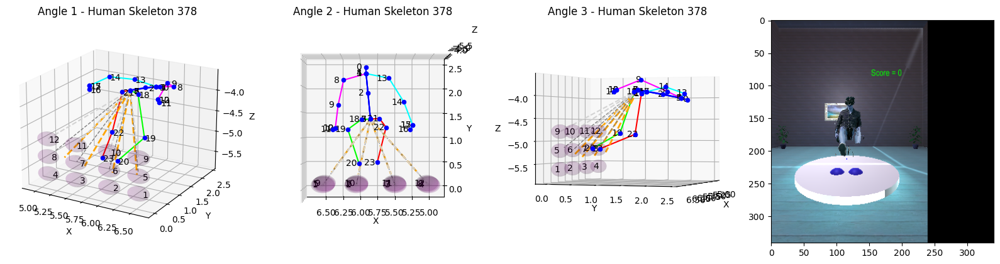

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

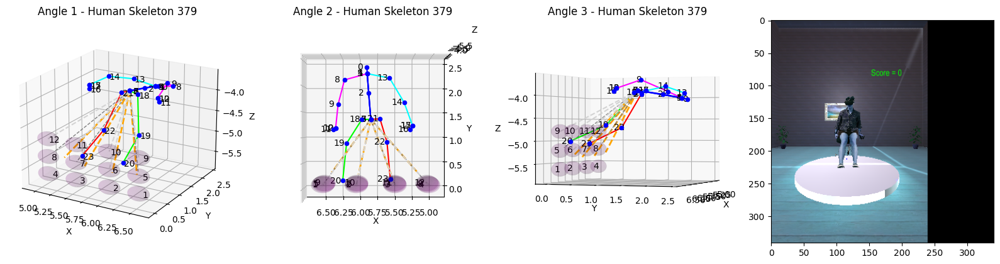

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

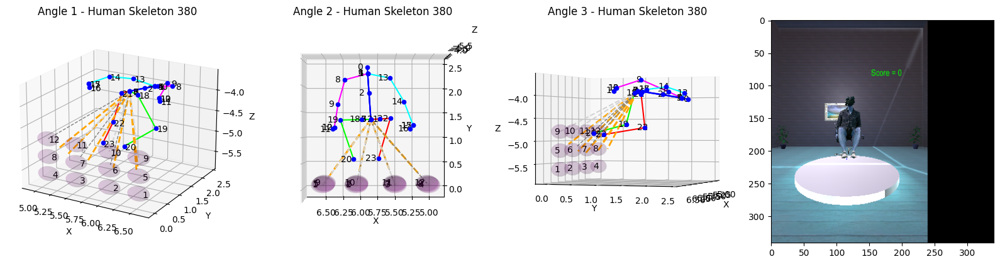

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

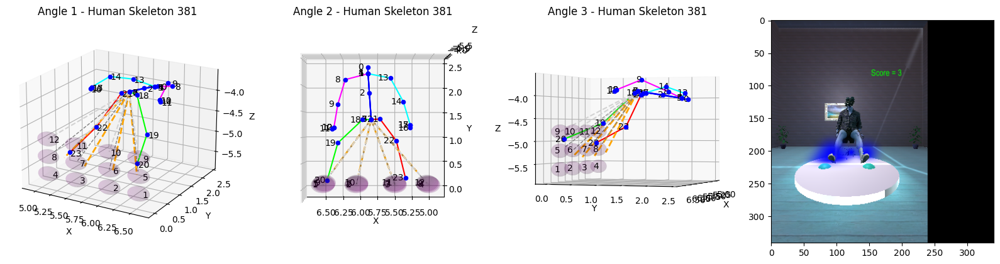

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

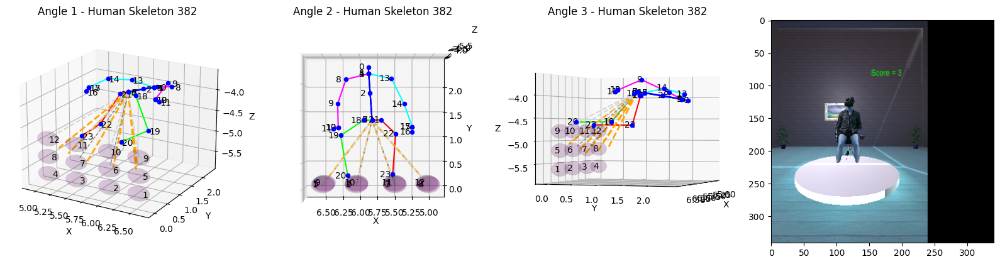

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

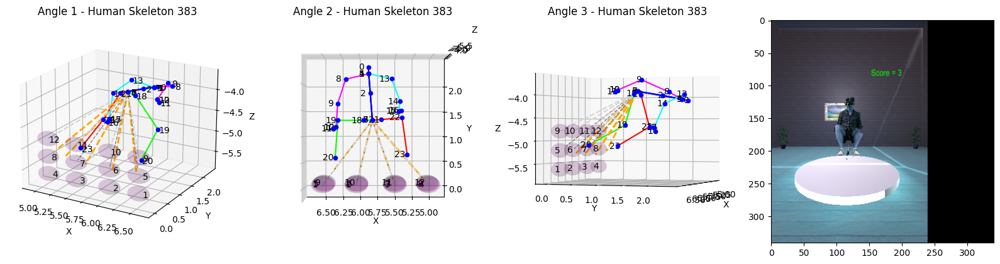

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

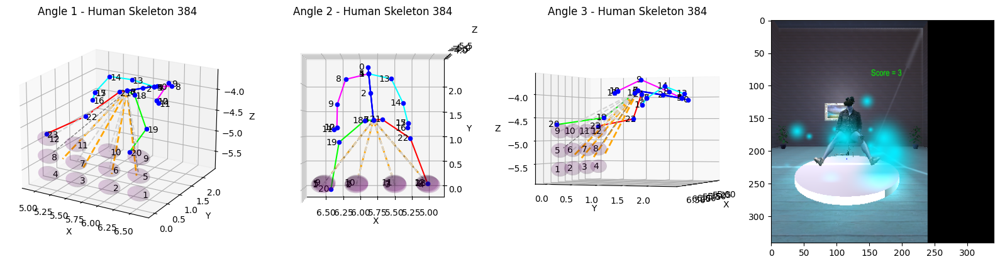

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

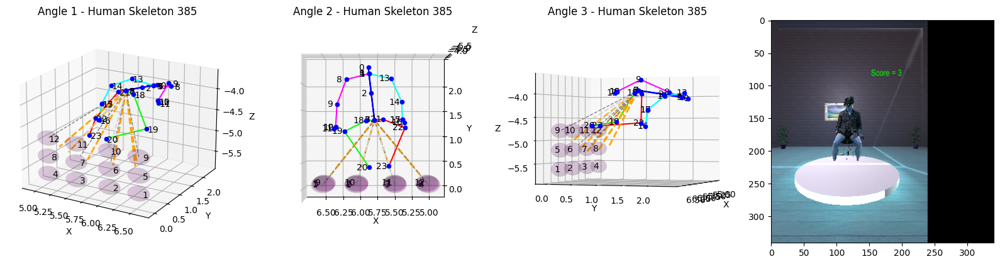

RadioButtons(description='Temporal:', options=(('0', '0'), ('1', '1')), value='0')

Button(description='Update Labels', style=ButtonStyle())

Labels updated for index 366.
Labels updated for index 367.
Labels updated for index 368.
Labels updated for index 369.
Labels updated for index 370.
Labels updated for index 371.
Labels updated for index 372.
Labels updated for index 373.
Labels updated for index 374.
Labels updated for index 375.
Labels updated for index 376.
Labels updated for index 375.
Labels updated for index 377.
Labels updated for index 377.
Labels updated for index 378.
Labels updated for index 379.
Labels updated for index 380.
Labels updated for index 381.
Labels updated for index 382.
Labels updated for index 383.
Labels updated for index 382.
Labels updated for index 384.


In [ ]:
for index in range(365,385):
    interactive_plot_and_label_spheres(df, int(index))